In [ ]:
                     Name:saloni Bundele

In [1]:
#linear algebra
import numpy as np
# data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd
from IPython.display import display
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
import matplotlib.pyplot as plt
#Also importing 'seaborn' library to better visualize the distributions
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

### 1.Problem Statment-

In [ ]:
LIC Lapse or Not Lapse prediction.

### 2.Data Gathering

In [2]:
#Read the csv file using read_csv 
# method of pandas
df=pd.read_csv("Insurance.csv")
df.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,A,Urban,18000,1
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1


In [22]:
#The shape of the dataset can be found by the below code.
#View number of rows and columns
df.shape

(79853, 13)

### 3.Exploratory Data Analysis(EDA)-

#### 3.1 Missing Value

In [ ]:
The first thing is to check if there is any missing value in the dataset. 
I used python to extract the columns which contains the missing value as well as the percentage of missing value.

In [3]:
# checking the missing values in the whole insurance dataset using 'isna' function:
df.isna().sum()    

id                                     0
perc_premium_paid_by_cash_credit       0
age_in_days                            0
Income                                 0
Count_3-6_months_late                 97
Count_6-12_months_late                97
Count_more_than_12_months_late        97
application_underwriting_score      2974
no_of_premiums_paid                    0
sourcing_channel                       0
residence_area_type                    0
premium                                0
target                                 0
dtype: int64

 - Insides

In [ ]:
1.In dataset their are missing values are there.
2.column of the Count_3-6_months_late in 97  missing value present.
3.column of the Count_6-12_months_late  in 97 missing value present.
4.column of the application_underwriting_score in 2974 missing value present.
5.No other column in the dataset has any missing value.

In [4]:
df.isna().mean()*100   #missing value as well as the percentage of missing value.

id                                  0.000000
perc_premium_paid_by_cash_credit    0.000000
age_in_days                         0.000000
Income                              0.000000
Count_3-6_months_late               0.121473
Count_6-12_months_late              0.121473
Count_more_than_12_months_late      0.121473
application_underwriting_score      3.724343
no_of_premiums_paid                 0.000000
sourcing_channel                    0.000000
residence_area_type                 0.000000
premium                             0.000000
target                              0.000000
dtype: float64

In [4]:
#Check null values in original dataset
#All information about dataset
df.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79853 entries, 0 to 79852
Data columns (total 13 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                79853 non-null  int64  
 1   perc_premium_paid_by_cash_credit  79853 non-null  float64
 2   age_in_days                       79853 non-null  int64  
 3   Income                            79853 non-null  int64  
 4   Count_3-6_months_late             79756 non-null  float64
 5   Count_6-12_months_late            79756 non-null  float64
 6   Count_more_than_12_months_late    79756 non-null  float64
 7   application_underwriting_score    76879 non-null  float64
 8   no_of_premiums_paid               79853 non-null  int64  
 9   sourcing_channel                  79853 non-null  object 
 10  residence_area_type               79853 non-null  object 
 11  premium                           79853 non-null  int64  
 12  targ

- Insides

In [ ]:
1.This shows there are 5 columns of int type, 5 columns of float type, & 2 columns of object type in the insurance dataset.
2.The range of index 79853 entires
3.memory usage :7.9+MB

In [5]:
# Statistical Summery for our dataset
df.describe()  

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,target
count,79853.000000,79853.000000,79853.000000,7.985300e+04,79756.000000,79756.000000,79756.000000,76879.000000,79853.000000,79853.000000,79853.000000
mean,57167.166368,0.314288,18846.696906,2.088472e+05,0.248671,0.078188,0.060008,99.067291,10.863887,10924.507533,0.937410
std,32928.970160,0.334915,5208.719136,4.965826e+05,0.691468,0.436507,0.312023,0.739799,5.170687,9401.676542,0.242226
min,2.000000,0.000000,7670.000000,2.403000e+04,0.000000,0.000000,0.000000,91.900000,2.000000,1200.000000,0.000000
25%,28640.000000,0.034000,14974.000000,1.080100e+05,0.000000,0.000000,0.000000,98.810000,7.000000,5400.000000,1.000000
50%,57262.000000,0.167000,18625.000000,1.665600e+05,0.000000,0.000000,0.000000,99.210000,10.000000,7500.000000,1.000000
75%,85632.000000,0.538000,22636.000000,2.520900e+05,0.000000,0.000000,0.000000,99.540000,14.000000,13800.000000,1.000000
max,114076.000000,1.000000,37602.000000,9.026260e+07,13.000000,17.000000,11.000000,99.890000,60.000000,60000.000000,1.000000


#### Observation

- Average age_in_days of the primary beneficiary is 79853.000000 and Maximum age_in_days is 37602.000000
- Average Income is 7.985300e+04, that is out of normal Income range,Maximum Income is 9.026260e+07
- Average of No_of_premiums_paid is 79853.000000 ,Median is 10.000000, Maximum is 60.000000
- For Id,age_in_days,application_underwriting_score,no_of_premiums_paid,mean is almost equal to median,suggesting data 
  is normally distributed.
- Median is less than mean in charges , indicating distrubution is postively skewed .

In [6]:
df.head()      # First five Records\rows

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,A,Urban,18000,1
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1


In [7]:
df.tail()    #Last five Records\rows

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
79848,48057,0.425,23367,224550,1.0,0.0,0.0,98.70,19,B,Urban,13800,1
79849,59012,0.704,19356,279150,1.0,0.0,1.0,99.42,12,A,Rural,28500,1
79850,77050,0.000,23372,305020,0.0,0.0,0.0,98.89,12,A,Rural,9600,1
79851,67225,0.398,22641,39330,0.0,0.0,0.0,98.68,8,A,Rural,5700,1
79852,71531,0.550,15709,280140,1.0,0.0,1.0,99.84,8,A,Urban,9600,0


In [6]:
# Numerical Feature
df.select_dtypes(exclude=object)

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,target
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,3300,1
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,18000,1
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,3300,0
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,9600,1
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,9600,1
...,...,...,...,...,...,...,...,...,...,...,...
79848,48057,0.425,23367,224550,1.0,0.0,0.0,98.70,19,13800,1
79849,59012,0.704,19356,279150,1.0,0.0,1.0,99.42,12,28500,1
79850,77050,0.000,23372,305020,0.0,0.0,0.0,98.89,12,9600,1
79851,67225,0.398,22641,39330,0.0,0.0,0.0,98.68,8,5700,1


In [7]:
# categorical variables
df.select_dtypes(include=object)

,sourcing_channel,residence_area_type
0,C,Urban
1,A,Urban
2,C,Rural
3,A,Urban
4,B,Urban
...,...,...
79848,B,Urban
79849,A,Rural
79850,A,Rural
79851,A,Rural


- Insides

In [ ]:
 Two categorical features.

#### 3.2 ID

In [10]:
df["id"].unique() #check unique value Id column

array([110936,  41492,  31300, ...,  77050,  67225,  71531], dtype=int64)

In [11]:
df["id"].nunique() # Total count of unique value 

79853

In [12]:
df["id"].value_counts() # count of unique value

110936    1
105234    1
64751     1
71729     1
113932    1
         ..
84421     1
30336     1
85738     1
3510      1
71531     1
Name: id, Length: 79853, dtype: int64

#### 3.3 perc_premium_paid_by_cash_credit

In [13]:
df["perc_premium_paid_by_cash_credit"].unique() #unique values of column

array([0.429, 0.01 , 0.917, ..., 0.669, 0.948, 0.833])

In [14]:
df["perc_premium_paid_by_cash_credit"].nunique()   #total count of unique values

1001

In [15]:
df["perc_premium_paid_by_cash_credit"].value_counts()    #count of unique values

0.000    5723
1.000    5004
0.001     698
0.002     612
0.003     551
         ... 
0.640      19
0.869      17
0.759      17
0.851      16
0.742      15
Name: perc_premium_paid_by_cash_credit, Length: 1001, dtype: int64

<AxesSubplot:xlabel='perc_premium_paid_by_cash_credit', ylabel='Density'>

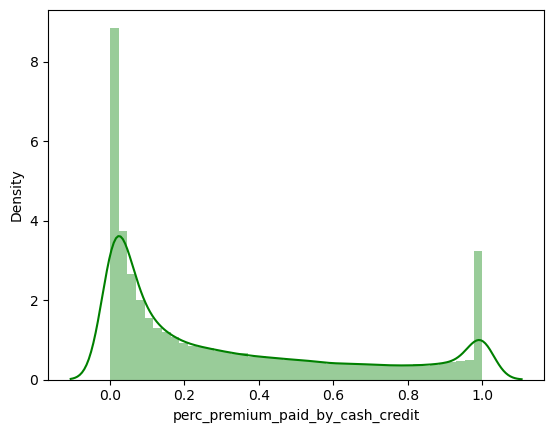

In [8]:
# Plotting the distribution of the 2nd column of insurance dataset using Histogram:
sns.distplot(df['perc_premium_paid_by_cash_credit'],color='green')

- Insides

In [ ]:
The reason why the plot for 'perc_premium_paid_by_cash_credit' column has so many values in between 0 & 1 is that this
column has 'float' values.

#### 3.4 age_in_days  

In [16]:
df["age_in_days"].unique()   #unique value of column

array([12058, 21546, 17531, 15341, 31400, 17527, 24829, 21911,  9868,
       23008, 17529, 16075, 16436, 19723, 16430, 12788, 23010, 22639,
       16433, 11687, 17530, 17895, 24466, 17161, 32495,  8406, 15342,
       22273, 21179, 15345, 13513, 11693, 23007, 13149, 21549, 23000,
       16438, 16799, 17165, 10594, 21545, 21542, 26290, 18992, 18262,
       16800, 33960, 22635, 14974, 16798, 21915, 13878, 13154, 16440,
       25194, 12420, 14610, 20810, 13875,  9870, 20454, 21905, 22277,
       14970, 21175, 17894, 26658, 22272, 17896, 23368,  9495, 18987,
       18989, 18259,  8044, 16072, 20085, 16804, 16065, 20811, 13514,
       21550, 13877, 19716, 15708, 25200, 10961, 23733, 15706, 22276,
       20086, 19350, 26295, 28119, 11695, 15707, 13148, 21177, 18257,
       17168, 21178, 14971, 22641,  8769, 22278, 22271, 23006,  9139,
       19717, 20089, 18627, 19721, 17163, 25920, 17526, 16073, 20818,
       23001, 14242, 23009, 26650, 18626, 20816, 15336, 18628, 13511,
       14979, 12421,

In [17]:
df["age_in_days"].nunique()   #total count of unique values

833

In [18]:
df["age_in_days"].value_counts()   #count of unique values

17899    226
16802    223
17895    219
17163    217
16801    216
        ... 
34317      1
36870      1
34320      1
7690       1
34318      1
Name: age_in_days, Length: 833, dtype: int64

#### 3.5 Income 

In [20]:
df["Income"].unique()    #unique value of columns

array([355060, 315150,  84140, ..., 453790, 224550,  39330], dtype=int64)

In [21]:
df["Income"].nunique()   #total count  unique of values

24165

In [22]:
df["Income"].value_counts()   #count of unique values

150130    171
150060    162
150090    158
150120    157
150050    154
         ... 
173940      1
28920       1
261800      1
152940      1
39330       1
Name: Income, Length: 24165, dtype: int64

#### 3.6 Count_3-6_months_late

In [23]:
df["Count_3-6_months_late"].unique()    #unique values of columns

array([ 0.,  2.,  1.,  3., nan,  4.,  7.,  5.,  6.,  8., 13., 12.,  9.,
       11., 10.])

In [24]:
df["Count_3-6_months_late"].nunique()     #total count of unique values

14

In [25]:
df["Count_3-6_months_late"].value_counts()     #count of unique values

0.0     66801
1.0      8826
2.0      2519
3.0       954
4.0       374
5.0       168
6.0        68
7.0        23
8.0        15
9.0         4
13.0        1
12.0        1
11.0        1
10.0        1
Name: Count_3-6_months_late, dtype: int64

#### 3.7 Count_6-12_months_late

In [26]:
df["Count_6-12_months_late"].unique()     #unique value of columns

array([ 0.,  3.,  6.,  2., 10.,  1., nan,  4.,  7.,  5., 17.,  9., 15.,
        8., 11., 14., 13., 12.])

In [27]:
df["Count_6-12_months_late"].nunique()     #total count of unique values

17

In [30]:
df["Count_6-12_months_late"].value_counts()     #count of unique values

0.0     75831
1.0      2680
2.0       693
3.0       317
4.0       130
5.0        46
6.0        26
7.0        11
8.0         5
10.0        4
9.0         4
11.0        2
14.0        2
13.0        2
17.0        1
15.0        1
12.0        1
Name: Count_6-12_months_late, dtype: int64

#### 3.8 Count_more_than_12_months_late

In [31]:
df["Count_more_than_12_months_late"].unique()     #unique value of columns

array([ 0.,  1.,  4.,  2., nan,  3.,  7.,  5., 11.,  6.,  8.])

In [32]:
df["Count_more_than_12_months_late"].nunique()     #total unique count values

10

In [33]:
df["Count_more_than_12_months_late"].value_counts()     #count of unique values

0.0     76038
1.0      2996
2.0       498
3.0       151
4.0        48
5.0        13
6.0         6
7.0         3
8.0         2
11.0        1
Name: Count_more_than_12_months_late, dtype: int64

#### 3.9 application_underwriting_score

In [34]:
df["application_underwriting_score"].unique()     #unique value of columns

array([99.02, 99.89, 98.69, 99.57, 99.87, 99.18, 99.05, 99.33, 99.58,
       98.91, 98.66, 97.03, 98.32, 99.59, 98.7 , 99.06, 99.66, 99.31,
         nan, 99.53, 99.22, 99.07, 99.72, 98.83, 99.84, 98.61, 99.6 ,
       98.79, 97.42, 97.44, 99.77, 98.94, 99.43, 99.32, 99.52, 92.82,
       98.77, 99.2 , 99.09, 97.85, 99.03, 99.5 , 98.19, 99.13, 99.1 ,
       98.93, 99.17, 98.43, 99.35, 98.9 , 99.25, 98.55, 98.89, 99.34,
       99.7 , 98.63, 99.64, 99.3 , 98.12, 98.37, 98.07, 99.01, 98.86,
       98.14, 99.83, 99.56, 99.63, 99.78, 98.6 , 98.57, 98.34, 99.79,
       98.76, 98.92, 99.41, 99.74, 99.62, 99.36, 99.39, 97.87, 98.88,
       99.86, 99.88, 99.54, 99.19, 99.  , 98.64, 95.47, 99.26, 99.08,
       99.65, 99.27, 99.11, 98.62, 98.71, 97.56, 98.49, 96.88, 98.82,
       98.47, 98.52, 98.72, 99.81, 99.8 , 99.23, 99.16, 99.37, 98.42,
       97.77, 99.42, 96.7 , 98.44, 98.59, 99.67, 98.84, 98.78, 98.95,
       99.47, 99.49, 97.75, 97.57, 98.31, 98.22, 99.44, 97.37, 99.29,
       99.12, 97.4 ,

In [36]:
df["application_underwriting_score"].nunique()      #total count of unique values

672

In [37]:
df["application_underwriting_score"].value_counts()     #count of unique values

99.89    1972
99.88    1343
99.87     856
99.86     693
99.30     642
         ... 
95.81       1
96.27       1
94.96       1
92.81       1
93.57       1
Name: application_underwriting_score, Length: 672, dtype: int64

#### 3.10 no_of_premiums_paid

In [38]:
df["no_of_premiums_paid"].unique()    #check the unique value

array([13, 21,  7,  9, 12, 11,  3,  4, 22, 10, 14,  5, 31,  8, 16, 15,  6,
       23, 20, 18, 17,  2, 28, 19, 25, 30, 24, 33, 29, 27, 26, 39, 35, 34,
       32, 42, 56, 40, 50, 36, 54, 38, 37, 53, 48, 47, 44, 41, 60, 52, 51,
       49, 58, 55, 43, 45, 59], dtype=int64)

In [39]:
df["no_of_premiums_paid"].nunique()       #total count of unique values

57

In [40]:
df["no_of_premiums_paid"].value_counts()   #count of unique values

8     7184
9     7158
10    6873
7     6623
11    6395
6     5635
12    5407
13    4752
5     4215
14    3988
15    3264
4     2907
16    2678
17    2148
18    1799
3     1746
19    1355
20    1134
21     838
2      726
22     713
23     503
24     386
25     305
26     241
27     186
28     152
29     119
30      91
31      61
32      51
33      43
34      38
35      31
36      23
37      14
38       8
42       7
40       6
41       6
39       5
47       5
44       4
45       3
43       3
51       3
56       3
48       3
50       3
52       2
53       2
58       2
54       2
60       1
49       1
55       1
59       1
Name: no_of_premiums_paid, dtype: int64

#### 3.11 sourcing_channel

In [41]:
df["sourcing_channel"].unique() #  check unique value

array(['C', 'A', 'B', 'D', 'E'], dtype=object)

In [42]:
df["sourcing_channel"].nunique()     #total number of unique count

5

In [43]:
df["sourcing_channel"].value_counts()   #count of unique value

A    43134
B    16512
C    12039
D     7559
E      609
Name: sourcing_channel, dtype: int64

#### 3.12 residence_area_type

In [44]:
df["residence_area_type"].unique()    #unique values of residence_area_type column

array(['Urban', 'Rural'], dtype=object)

In [45]:
df["residence_area_type"].nunique()    #total unique count values

2

In [46]:
df["residence_area_type"].value_counts()    #count of unique values

Urban    48183
Rural    31670
Name: residence_area_type, dtype: int64

<AxesSubplot:xlabel='residence_area_type', ylabel='count'>

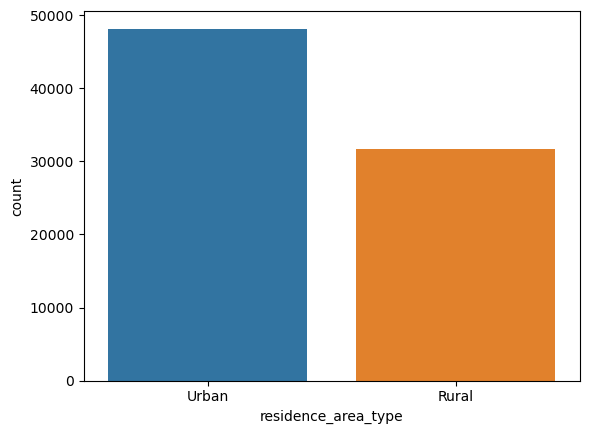

In [3]:
sns.countplot(df["residence_area_type"])

- Insides

In [ ]:
1.The residence_area_type column are present in only two unique values are there.
2.customer of this company live in urban area type and Rural area type
1.The company has 48,183 urban customers and 31,670 rural customers.

#### 3.13 premium 

In [48]:
df["premium"].unique()    #unique values of premium column

array([ 3300, 18000,  9600, 22200,  7500,  5400,  1200, 11700, 24300,
       13800, 34800,  5700, 15900, 28500, 47400, 32700, 26400, 39000,
       20100, 41100, 60000, 57900, 30600, 45300, 43200, 36900, 55800,
       49500, 51600, 53700], dtype=int64)

In [50]:
df["premium"].nunique()

30

In [51]:
df["premium"].value_counts()

5400     10932
7500     10194
3300      9857
9600      8419
1200      6900
11700     6832
13800     6548
5700      3071
18000     3062
15900     2831
20100     2422
22200     1839
24300     1368
26400     1055
28500      801
32700      688
30600      474
60000      419
34800      392
36900      359
39000      259
41100      207
57900      187
43200      158
45300      141
47400      134
49500      100
51600       81
53700       71
55800       52
Name: premium, dtype: int64

#### 3.14 Target

In [5]:
df["target"].value_counts()   #unique value count

1    74855
0     4998
Name: target, dtype: int64

<AxesSubplot:xlabel='target', ylabel='count'>

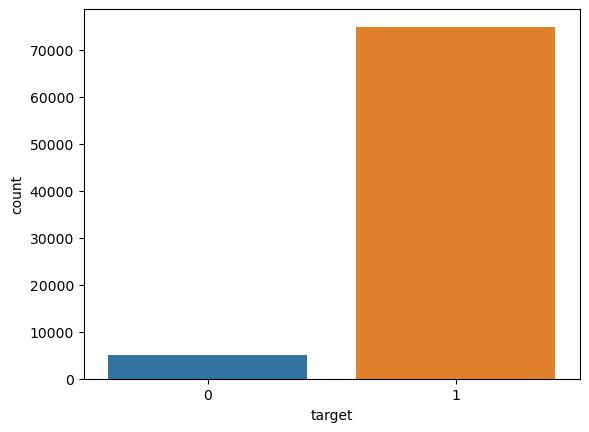

In [4]:
sns.countplot(df["target"])

- Insides

In [ ]:
74,855 customer paid their premium on time but 4998 customers did not pay their premium on time.

#### 3.15 Bivariate Analysis

In [ ]:
#The Relationship between perc_premium_paid_by_cash_credit and target columns. 
pd.crosstab(df["perc_premium_paid_by_cash_credit"],df["Income"])

<AxesSubplot:xlabel='perc_premium_paid_by_cash_credit', ylabel='Income'>

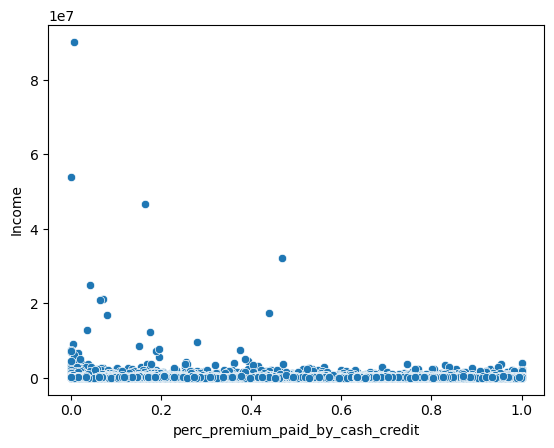

In [4]:
sns.scatterplot(data=df,x="perc_premium_paid_by_cash_credit",y="Income")

- Insides

This plot shows the following:
1.The customers who earn less than Rs 1 crore monthly as salary pay 0to100% of their premium by either cash or credit card.
2.The high income customers pay in range 0% to 50% of their premium by either cash or credit card.
3.The customer who earns around 9 crore a month pays 0% premium either by cash or credit card.
4.The customer who earns around 5 crore a month pays 20% premium by cash or credit card.
5.The customer who earns over 3 crore a month pays 50% premium by cash or credit card.
6.It seems the high income group must be using some other means to pay majority of their premium.

In [13]:
#The Relationship between Count_3-6_months_late and residence_area_type.
df1=pd.crosstab(df["residence_area_type"],df["Count_3-6_months_late"])

Count_3-6_months_late,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0
residence_area_type,,,,,,,,,,,,,,
Rural,26567,3425,996,402,140,62,27,7,9,3,1,0,1,0
Urban,40234,5401,1523,552,234,106,41,16,6,1,0,1,0,1


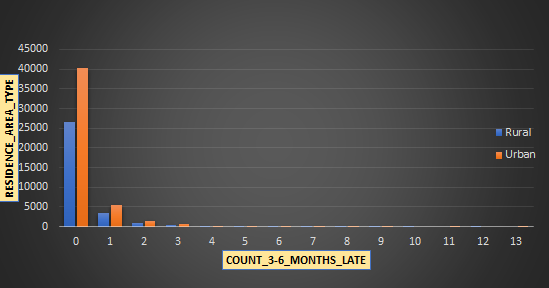

- Insides

- 40,234 urban customers & 26,567 rural customers have 0 premiums due by 3-6 months.
- 5,401 urban customers & 3,425 rural customers have 1 premium due to pay by 3-6 months.
- 106 urban customers & 62 rural customers are 5 premiums late by 3-6 months.
- 1 urban customer & no rural customer is 13 premiums late by 3-6 months.

In [14]:
#The relationship between residence_area_type and Count_6-12_months_late
pd.crosstab(df['residence_area_type'],df['Count_6-12_months_late'])

Count_6-12_months_late,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,17.0
residence_area_type,,,,,,,,,,,,,,,,,
Rural,30039,1110,271,130,55,14,11,4,2,1,1,0,1,0,1,0,0
Urban,45792,1570,422,187,75,32,15,7,3,3,3,2,0,2,1,1,1


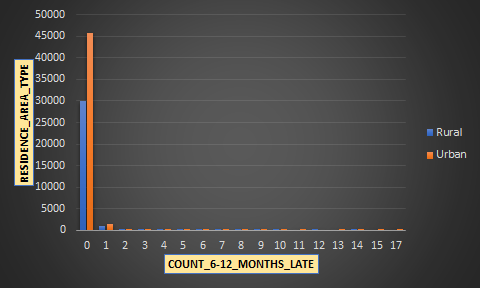

- Insides

In [ ]:
Here 3 urban & 1 rural customers are late by 10 premiums, 2 urban customers are late by 13 premiums, 
1 urban & 1 rural customers are late by 14, 1 urban customer is late by as much as 17 premiums by 6-12 months, etc.

In [16]:
#  the relation between residence area type & 'count more than 12 months' columns:
pd.crosstab(df['residence_area_type'],df['Count_more_than_12_months_late'])

Count_more_than_12_months_late,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,11.0
residence_area_type,,,,,,,,,,
Rural,30135,1209,217,58,14,4,2,0,1,0
Urban,45903,1787,281,93,34,9,4,3,1,1


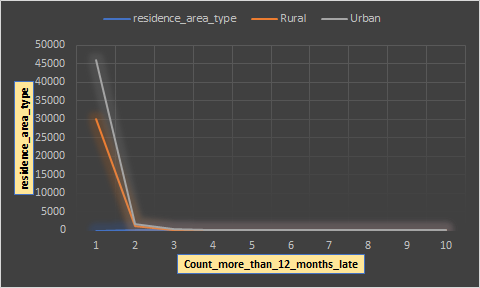

- Insides

In [ ]:
This table shows that the in 'more than 12 month' category, the maximum number of premiums late by an urban customer is 11.
While the maximum number of premiums late by a rural customer is 8.

In [16]:
#The relationship between age_in days and Income
pd.crosstab(df["age_in_days"],df["Income"])

Income,24030,24040,24050,24060,24070,24080,24090,24100,24110,24120,...,12847560,16874010,17471210,20986030,21075130,25051240,32175090,46803140,53821900,90262600
age_in_days,,,,,,,,,,,,,,,,,,,,,
7670,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7671,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7672,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7673,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7674,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36870,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
36874,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
37239,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<AxesSubplot:xlabel='age_in_days', ylabel='Income'>

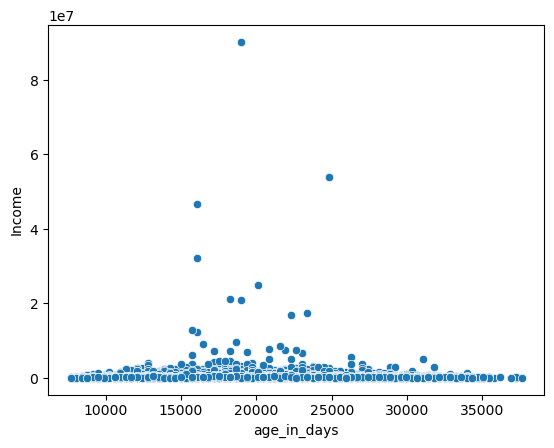

In [13]:
sns.scatterplot(data=df,x="age_in_days",y="Income")

- Insides

In [ ]:
1.The maximum age of customers in the insurance dataset is around 38000 days & minimum age is around 4000 days.
2.Majority of the customers earn income less than Rupees 1x10^7 (1 crore) monthly.
3.Few anomalies are present in the income as some customers do earn a lot ranging from Rs 1 crore to Rs 9 crore monthly!
4.The age range of these highly earning individuals lie between 15000 days to 25000 days.

In [12]:
# Now I'll check the relation between the 'Sourcing channel' & residence area type to see if residents of the two area type
# prefer different types of sourcing channel:
pd.crosstab(df['residence_area_type'],df['sourcing_channel'])

sourcing_channel,A,B,C,D,E
residence_area_type,,,,,
Rural,17115,6506,4780,2999,270
Urban,26019,10006,7259,4560,339


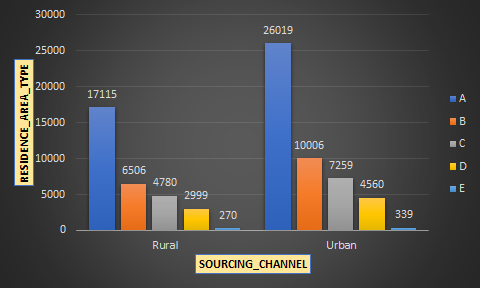

-  Insides

- 17,115 rural customers prefer the sourcing channel A, whereas 26,019 urban customers prefer channel A.-
- 6,506 rural customers prefer the sourcing channel B, whereas 10,006 urban customers prefer channel B.
- 4,780 rural customers prefer the sourcing channel C, whereas 7,259 urban customers prefer channel C.
- 2,999 rural customers prefer the sourcing channel D, whereas 4,560 urban customers prefer channel D.
- 270 rural customers prefer the sourcing channel E, whereas 339 urban customers prefer channel E.

<AxesSubplot:xlabel='target', ylabel='Income'>

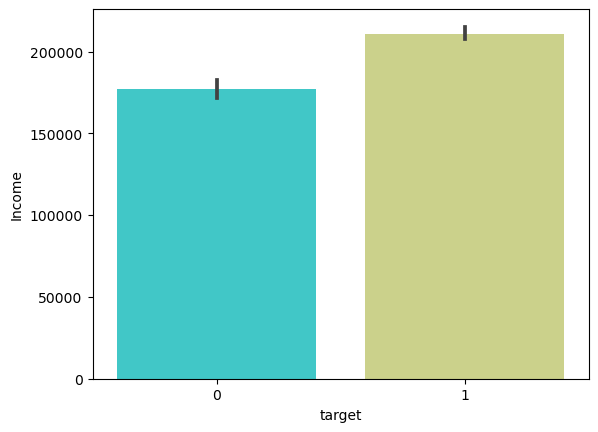

In [9]:
 #To make sure about the rich customer category I'll make a final barplot to see the relation between income & 
#'target' column:
sns.barplot(df['target'],df['Income'],palette='rainbow')


- Insides

In [ ]:
This shows that the customers who earn under Rs 1,80,000 a month are the ones the insurance company should be worried about
As they are the ones who did not pay their premiums on time.

In [7]:
df.groupby("sourcing_channel")["application_underwriting_score"].mean()

sourcing_channel
A    99.102432
B    99.055857
C    98.979512
D    99.038356
E    99.067980
Name: application_underwriting_score, dtype: float64

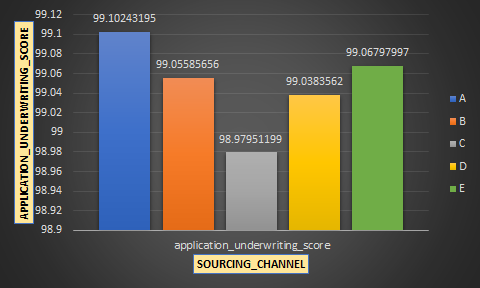

- Insides

In [ ]:
There is a significant difference in C,A,B,D and E.
Average charges for C 98.979512,A 99.102432,B 99.055857,D 99.038356,and E 99.067980

In [10]:
df.groupby("residence_area_type")["target"].mean()

residence_area_type
Rural    0.936912
Urban    0.937737
Name: target, dtype: float64

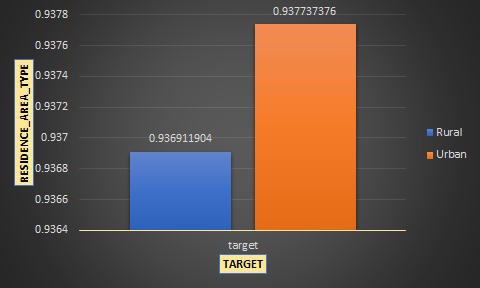

- Insides

In [ ]:
residence area type their are two customer. The customer should be same target.

In [11]:
df.groupby("sourcing_channel")["residence_area_type"].max()

sourcing_channel
A    Urban
B    Urban
C    Urban
D    Urban
E    Urban
Name: residence_area_type, dtype: object

In [12]:
df.groupby("sourcing_channel")["residence_area_type"].min()

sourcing_channel
A    Rural
B    Rural
C    Rural
D    Rural
E    Rural
Name: residence_area_type, dtype: object

#### 3.13 Outliers

- Often outliers can be seen with visualizations using a box plot.

<AxesSubplot:>

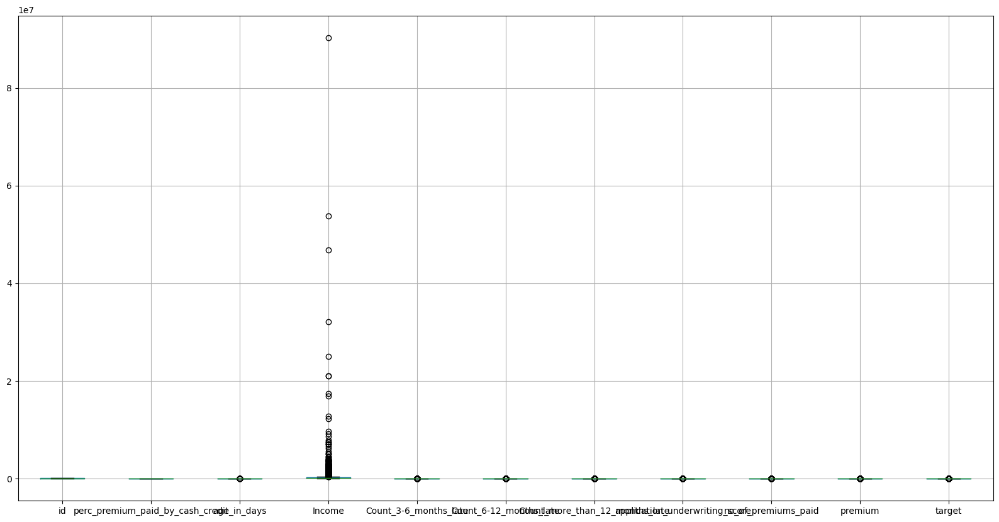

In [3]:
plt.figure(figsize=(20,10))   # Visualization of outlier using boxplot 
df.boxplot()

- Insides

In [ ]:
In Income column are outlier present.

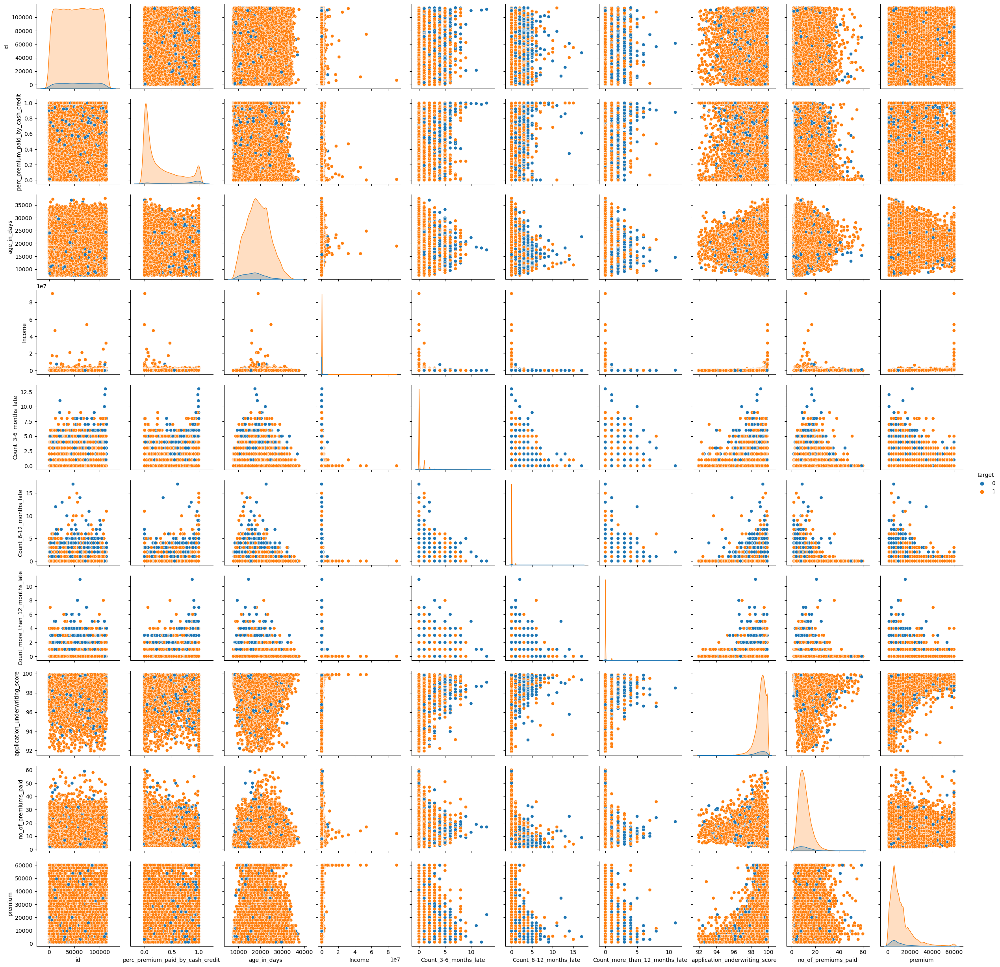

In [6]:
sns.pairplot(df,hue="target")

#### 3.13.3 Income

<AxesSubplot:>

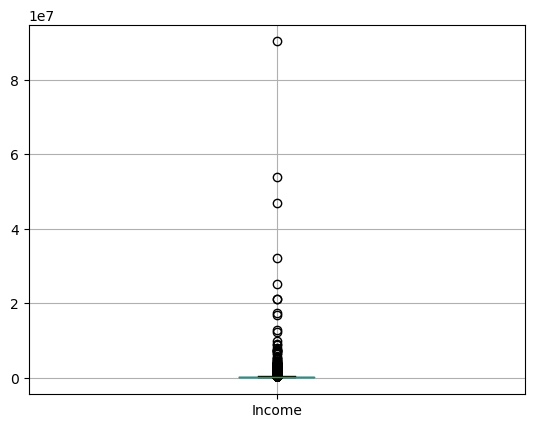

In [14]:
df[["Income"]].boxplot()

- Insides

In [ ]:
This boxplot shows that majority of customers get income under Rs 1x10^7 (1 crore) per month.
Two points between 4 & 6 on the plot show incomes below 5 crores & above 5 crores per month.
The maximum income on the dataset is more than Rs 8 crores per month.

- Insides-The premium column in outlier are present

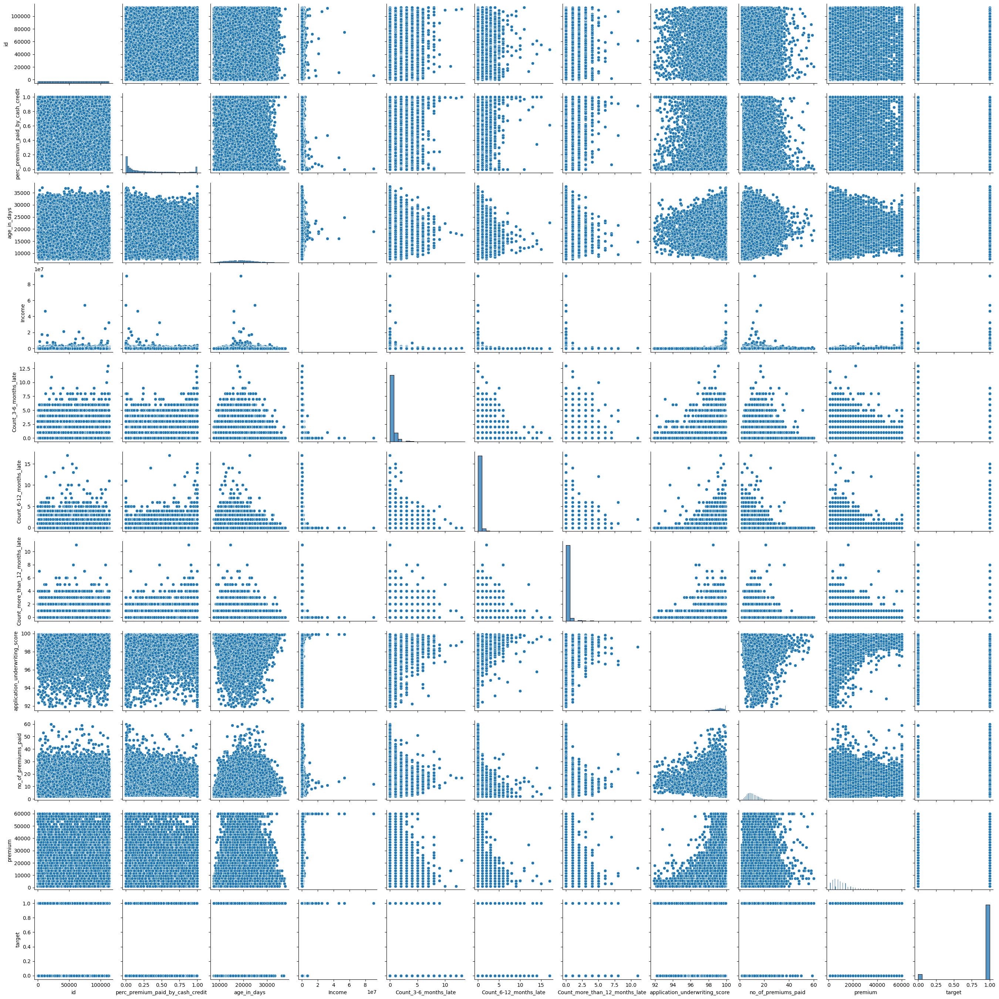

In [9]:
sns.pairplot(df)

### 4. Feature Engineering

In [5]:
# Firstly, checking the missing values in the whole Insurance dataset using 'isna()' function:
df.isna().sum()

id                                     0
perc_premium_paid_by_cash_credit       0
age_in_days                            0
Income                                 0
Count_3-6_months_late                 97
Count_6-12_months_late                97
Count_more_than_12_months_late        97
application_underwriting_score      2974
no_of_premiums_paid                    0
sourcing_channel                       0
residence_area_type                    0
premium                                0
target                                 0
dtype: int64

- Insides


1.There are 97 missing values in Count_3-6_months_late column
2.There are 97 missing values in Count_6-12_months_late column
3.There are 97 missing values in Count_more_than_12_months_late column
4.There are 2,974 missing values in application_underwriting_score column
5.No other column in the dataset has any missing value.

#### 4.1 Count_3-6_months_late

In [ ]:
#  So, filling the missing values using 'fillna' function in Count_3-6_months_late column using mode function.

In [6]:
df["Count_3-6_months_late"].isna().sum()     #checking for the Missing values using isna()function

97

In [7]:
df["Count_3-6_months_late"].mode()[0]

0.0

In [8]:
df["Count_3-6_months_late"].fillna(df["Count_3-6_months_late"].mode()[0],inplace=True) #To filling the missing values.

In [9]:
df["Count_3-6_months_late"].isna().sum()    #After Filling check

0

#### 4.2 Count_6-12_months_late

In [10]:
#  So, filling the missing values using 'fillna' function in Count_6-12_months_late column using mode function.

In [11]:
df["Count_6-12_months_late"].isna().sum() #checking for thr Missing values using isna()function

97

In [12]:
df["Count_6-12_months_late"].mode()[0]

0.0

In [13]:
df["Count_6-12_months_late"].fillna(df["Count_6-12_months_late"].mode()[0],inplace=True)#To filling the missing values

In [14]:
df["Count_6-12_months_late"].isna().sum()    #After Filling check

0

#### 4.3 Count_more_than_12_months_late

In [ ]:
#  So, filling the missing values using 'fillna' function in Count_more_than_12_months_late column using mode function.

In [15]:
df["Count_more_than_12_months_late"].isna().sum()   #checking for thr Missing values using isna()function

97

In [16]:
df["Count_more_than_12_months_late"].mode()[0]

0.0

In [17]:
df["Count_more_than_12_months_late"].fillna(df["Count_more_than_12_months_late"].mode()[0],inplace=True)#To filling the missing values

In [18]:
df["Count_more_than_12_months_late"].isna().sum()   #After Filling check

0

#### 4.4 application_underwriting_score

In [ ]:
# Filling up missing values in 'application_underwriting_score column' with the mean of this column:

In [19]:
df["application_underwriting_score"].isna().sum()  #checking for thr Missing values using isna()function

2974

In [20]:
df["application_underwriting_score"].mean()

99.06729119785102

In [21]:
df["application_underwriting_score"].fillna(df["application_underwriting_score"].mean(),inplace=True) #To filling the missing values.

In [22]:
df["application_underwriting_score"].isna().sum()   #After Filling check

0

In [23]:
# Verifying if all missing values got filled up or not:
df.isna().sum()

id                                  0
perc_premium_paid_by_cash_credit    0
age_in_days                         0
Income                              0
Count_3-6_months_late               0
Count_6-12_months_late              0
Count_more_than_12_months_late      0
application_underwriting_score      0
no_of_premiums_paid                 0
sourcing_channel                    0
residence_area_type                 0
premium                             0
target                              0
dtype: int64

- Inside

In [ ]:
Now no missing value in insurance data set.

### 4.5 Encoding

#### 4.5.1 residence_area_type

In [ ]:
# categorical data converted to the numerical data using Encoding

In [24]:
df["residence_area_type"].replace({"Urban":0,"Rural":1},inplace=True)
df["residence_area_type"].unique()  #after replacing check the unique value

array([0, 1], dtype=int64)

- Insides

In [ ]:
The residence_area_type column values are replce .
The Uraban value is replacing 0.
The Rural value is replacing 1.

#### 4.5.2 sourcing_channel

In [25]:
df["sourcing_channel"].replace({"A":0,"B":1,"C":2,"D":3,"E":4},inplace=True)
df["sourcing_channel"].unique()

array([2, 0, 1, 3, 4], dtype=int64)

- Insides

In [ ]:
The sourcing_channel in column values are replacing to used the replace funtion.
The 'A'is replce to 0,'B' replce to 1 'C' is replce to 2 'D' is replce is 3 and 'D' is replcing to the 4.


In [26]:
# After catergorical data is converted to the Numerical from
df.info()     

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79853 entries, 0 to 79852
Data columns (total 13 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                79853 non-null  int64  
 1   perc_premium_paid_by_cash_credit  79853 non-null  float64
 2   age_in_days                       79853 non-null  int64  
 3   Income                            79853 non-null  int64  
 4   Count_3-6_months_late             79853 non-null  float64
 5   Count_6-12_months_late            79853 non-null  float64
 6   Count_more_than_12_months_late    79853 non-null  float64
 7   application_underwriting_score    79853 non-null  float64
 8   no_of_premiums_paid               79853 non-null  int64  
 9   sourcing_channel                  79853 non-null  int64  
 10  residence_area_type               79853 non-null  int64  
 11  premium                           79853 non-null  int64  
 12  targ

- Inside

In [ ]:
All Data are in a Numerical from.

### 4.6 Outlier

In [27]:
df["Income"].describe()   # Statistical Summery for the Income column

count    7.985300e+04
mean     2.088472e+05
std      4.965826e+05
min      2.403000e+04
25%      1.080100e+05
50%      1.665600e+05
75%      2.520900e+05
max      9.026260e+07
Name: Income, dtype: float64

- Handling of the outlier using IQR Method

In [28]:
Q1 = df["Income"].quantile(0.25)
Q2 = df["Income"].quantile(0.50)
Q3 = df["Income"].quantile(0.75)
iqr  = Q3- Q1
upper_tail = Q3 + 1.5*iqr
lower_tail = Q1 - 1.5*iqr
# print("upper tail",upper_tail)
# print("lower tail",lower_tail)

In [29]:
# detection of outliers
# capping of outliers with mean, mode,median
df.loc[df["Income"]>upper_tail]

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
69,97679,0.480,26658,494050,0.0,0.0,0.0,98.890000,20,1,0,24300,1
92,34577,0.163,22276,900030,0.0,0.0,0.0,99.660000,12,0,1,39000,1
131,66151,0.113,18628,509070,0.0,0.0,0.0,99.260000,22,2,0,24300,1
141,94682,0.108,23365,510070,0.0,0.0,0.0,98.620000,12,0,0,5400,1
163,90621,0.559,13883,495070,1.0,0.0,0.0,99.100000,11,1,0,22200,1
175,27067,0.154,18260,512170,0.0,0.0,0.0,99.360000,17,2,1,41100,1
202,62658,0.102,17168,582110,0.0,0.0,0.0,99.430000,15,3,0,60000,1
211,77468,0.501,20447,552150,0.0,0.0,0.0,99.260000,24,1,1,57900,1
212,76190,0.162,13882,525150,0.0,0.0,0.0,99.540000,20,0,1,22200,1
218,25821,0.334,19356,514540,0.0,0.0,0.0,98.930000,23,1,0,18000,1


In [12]:
# To check the lower_tail outlier is there the Income column
df.loc[df["Income"]<lower_tail]

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target


In [30]:
# mean is without outliers
mean_income = df.loc[(df["Income"]<=upper_tail),"Income"].mean()
mean_income

179288.4389924763

In [31]:
df.loc[(df["Income"] > upper_tail),"Income"] = mean_income

In [32]:
df["Income"].value_counts()

179288.438992    3428
150130.000000     171
150060.000000     162
150090.000000     158
150120.000000     157
150050.000000     154
150100.000000     152
150070.000000     149
150110.000000     142
150030.000000     136
150080.000000     135
120140.000000     132
180070.000000     126
150150.000000     124
120060.000000     123
120110.000000     122
150140.000000     122
120130.000000     121
180140.000000     119
120090.000000     116
150040.000000     116
120150.000000     115
120030.000000     112
180040.000000     112
180030.000000     112
120080.000000     110
120040.000000     109
180110.000000     107
180090.000000     106
120050.000000     105
120100.000000     103
75130.000000      103
180080.000000     102
180150.000000     102
180060.000000     102
90070.000000      102
90090.000000      101
75060.000000      100
90060.000000      100
300150.000000      98
300140.000000      98
120070.000000      97
90130.000000       96
75050.000000       96
300030.000000      96
180130.000

<AxesSubplot:xlabel='Income'>

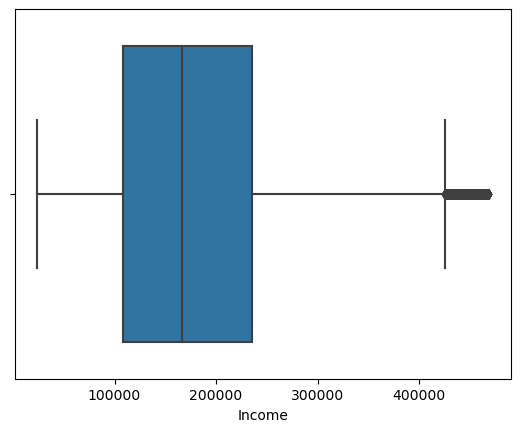

In [16]:
sns.boxplot(df["Income"])

### 4.7 Feature Creation

In [33]:
# Will get First five record
df.head()


,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
0,110936,0.429,12058,355060.0,0.0,0.0,0.0,99.02,13,2,0,3300,1
1,41492,0.010,21546,315150.0,0.0,0.0,0.0,99.89,21,0,0,18000,1
2,31300,0.917,17531,84140.0,2.0,3.0,1.0,98.69,7,2,1,3300,0
3,19415,0.049,15341,250510.0,0.0,0.0,0.0,99.57,9,0,0,9600,1
4,99379,0.052,31400,198680.0,0.0,0.0,0.0,99.87,12,1,0,9600,1


In [34]:
df["no_of_premiums_paid"].value_counts()

8     7184
9     7158
10    6873
7     6623
11    6395
6     5635
12    5407
13    4752
5     4215
14    3988
15    3264
4     2907
16    2678
17    2148
18    1799
3     1746
19    1355
20    1134
21     838
2      726
22     713
23     503
24     386
25     305
26     241
27     186
28     152
29     119
30      91
31      61
32      51
33      43
34      38
35      31
36      23
37      14
38       8
42       7
40       6
41       6
39       5
47       5
44       4
45       3
43       3
51       3
56       3
48       3
50       3
52       2
53       2
58       2
54       2
60       1
49       1
55       1
59       1
Name: no_of_premiums_paid, dtype: int64

In [35]:
buckets = [0,18,30,45,60,np.inf]
labels  = [0,1,2,3,4]
df["premiums_bucket"] = pd.cut(df["no_of_premiums_paid"],bins=buckets,labels=labels,include_lowest=True,right=False)
df["premiums_bucket"].value_counts()

0    71699
1     7731
2      391
3       31
4        1
Name: premiums_bucket, dtype: int64

In [36]:
df[["no_of_premiums_paid","premiums_bucket"]].head()

,no_of_premiums_paid,premiums_bucket
0,13,0
1,21,1
2,7,0
3,9,0
4,12,0


In [37]:
pd.crosstab(df["premiums_bucket"],df["target"])

target,0,1
premiums_bucket,,
0,4449,67250
1,517,7214
2,27,364
3,5,26
4,0,1


In [38]:
df["Risky"] = np.where(df["premiums_bucket"]>1,1,0) # 1- risky 0, not risky
df["Risky"].value_counts()

0    79430
1      423
Name: Risky, dtype: int64

In [39]:
df.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target,premiums_bucket,Risky
0,110936,0.429,12058,355060.0,0.0,0.0,0.0,99.02,13,2,0,3300,1,0,0
1,41492,0.010,21546,315150.0,0.0,0.0,0.0,99.89,21,0,0,18000,1,1,0
2,31300,0.917,17531,84140.0,2.0,3.0,1.0,98.69,7,2,1,3300,0,0,0
3,19415,0.049,15341,250510.0,0.0,0.0,0.0,99.57,9,0,0,9600,1,0,0
4,99379,0.052,31400,198680.0,0.0,0.0,0.0,99.87,12,1,0,9600,1,0,0


In [40]:
df["Count_6-12_months_late"].value_counts()

0.0     75928
1.0      2680
2.0       693
3.0       317
4.0       130
5.0        46
6.0        26
7.0        11
8.0         5
10.0        4
9.0         4
11.0        2
14.0        2
13.0        2
17.0        1
15.0        1
12.0        1
Name: Count_6-12_months_late, dtype: int64

In [41]:
df["late_paid"] = df["Count_6-12_months_late"].apply(lambda x: 1 if x >1 else 0)
df["late_paid"].value_counts()

0    78608
1     1245
Name: late_paid, dtype: int64

In [42]:
df.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target,premiums_bucket,Risky,late_paid
0,110936,0.429,12058,355060.0,0.0,0.0,0.0,99.02,13,2,0,3300,1,0,0,0
1,41492,0.010,21546,315150.0,0.0,0.0,0.0,99.89,21,0,0,18000,1,1,0,0
2,31300,0.917,17531,84140.0,2.0,3.0,1.0,98.69,7,2,1,3300,0,0,0,1
3,19415,0.049,15341,250510.0,0.0,0.0,0.0,99.57,9,0,0,9600,1,0,0,0
4,99379,0.052,31400,198680.0,0.0,0.0,0.0,99.87,12,1,0,9600,1,0,0,0
